# Parity Plots for Velocity Model-1, Model-2 and Current Model


In [36]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path
import sys
from matplotlib_inline.backend_inline import set_matplotlib_formats
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.gridspec import GridSpec

In [37]:
sys.path.append(str(Path().resolve().parent.parent))
from path_manager import VEL_MODELS, MISC_DIR

          time      speed
17  312.244898  24.285714
18  330.612245  24.880952
19  348.979592  25.476190
20  367.346939  22.630385
21  385.714286  23.650794
..         ...        ...
39  716.326531  23.769841
40  734.693878  23.979592
41  753.061224  24.092971
42  771.428571  24.206349
43  789.795918  24.319728

[27 rows x 2 columns]


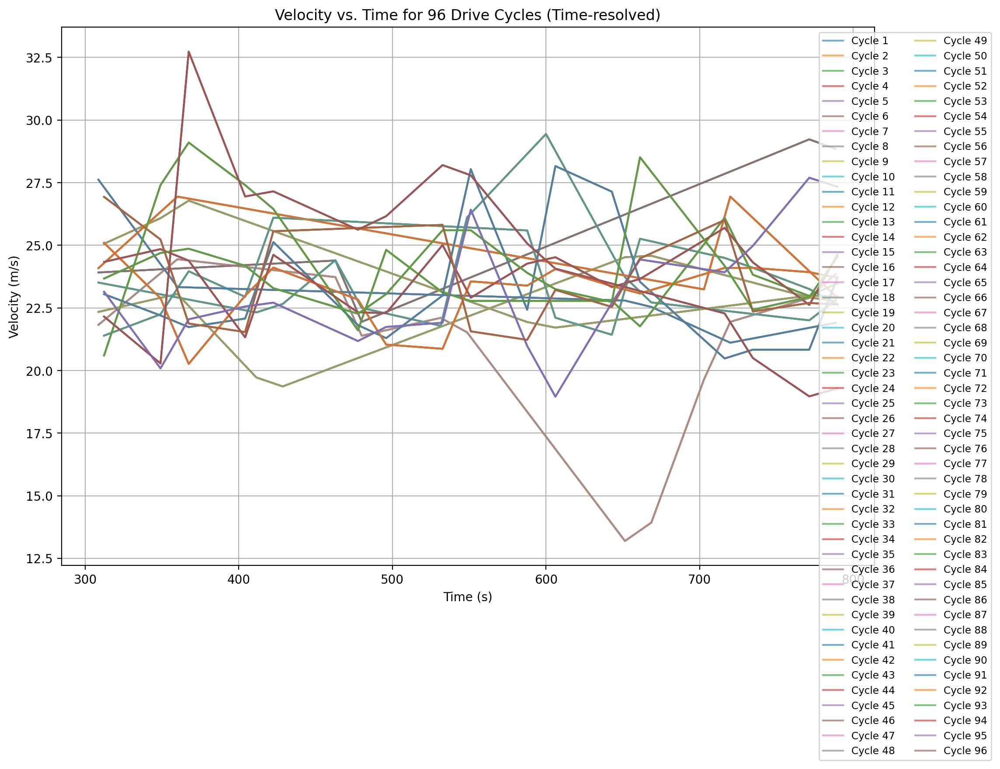

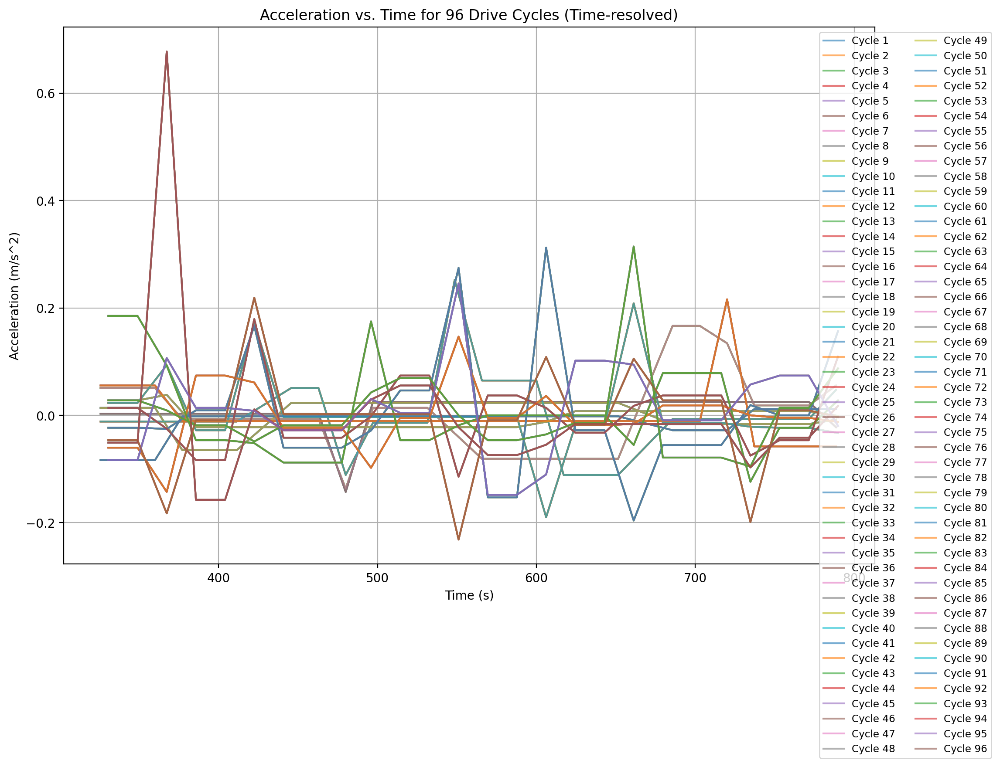

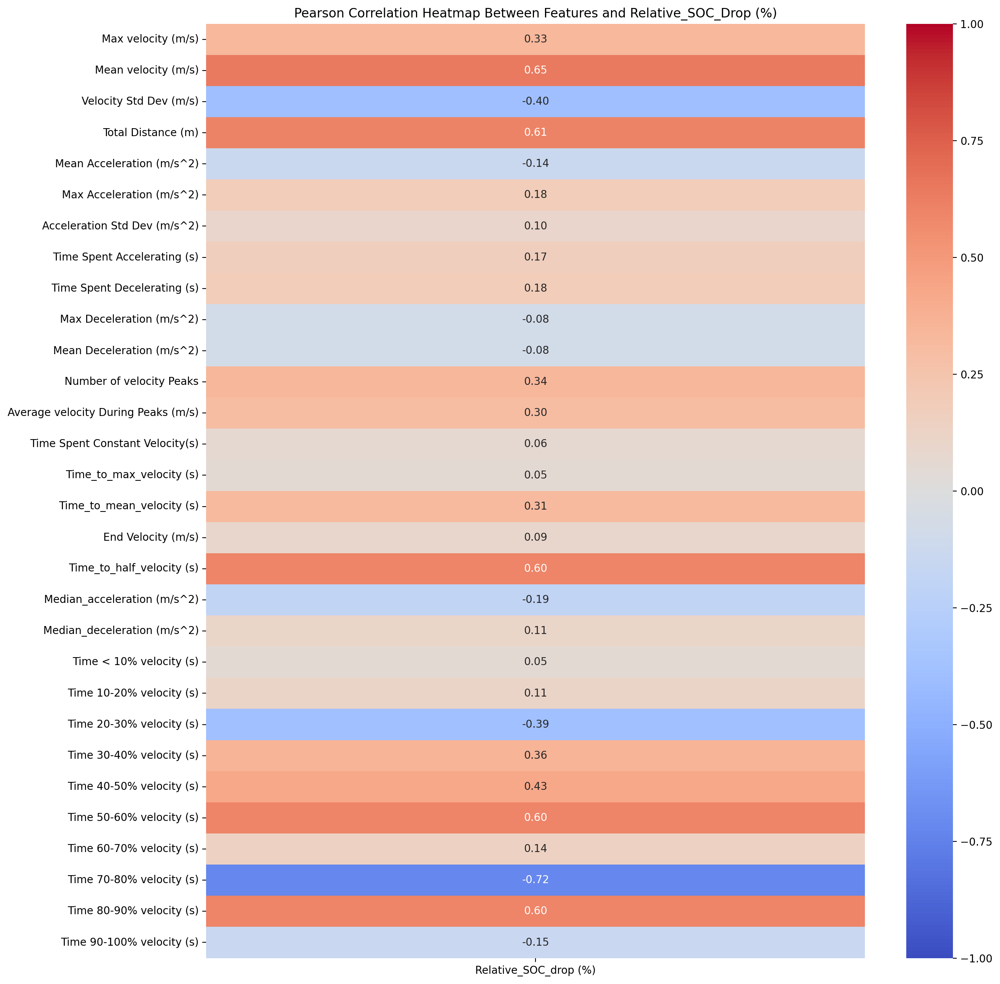

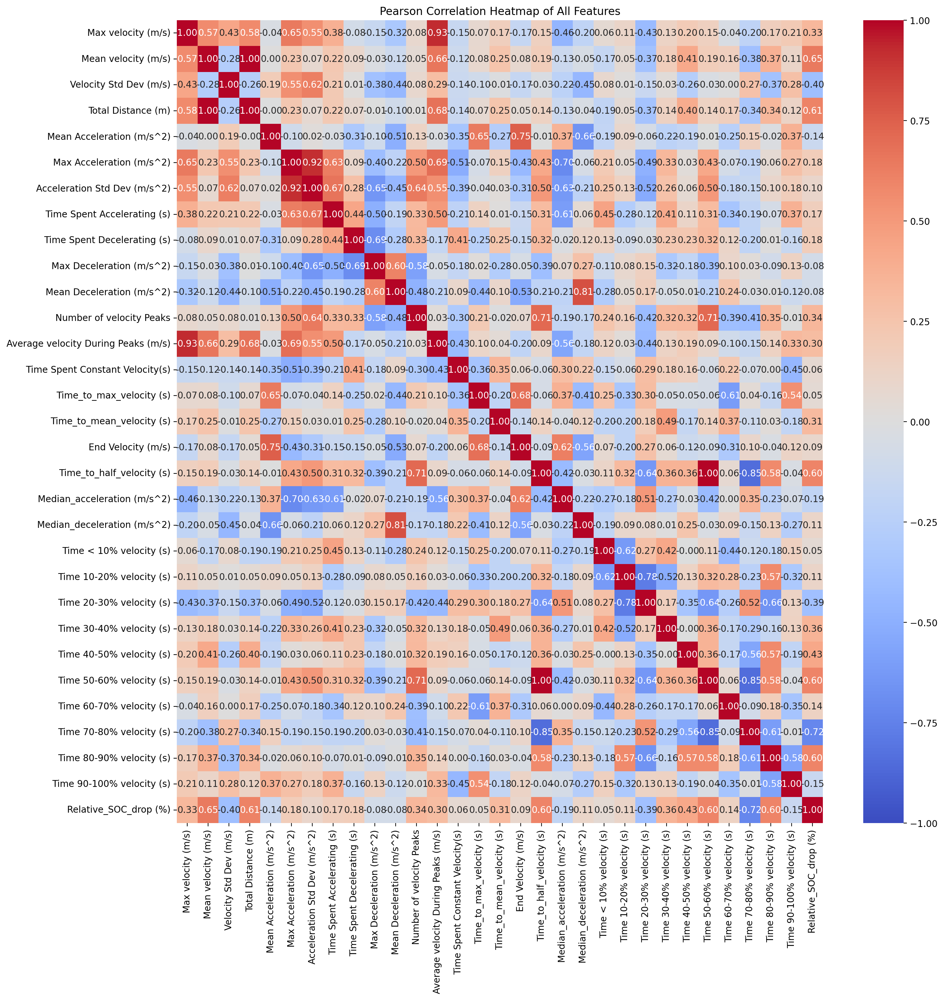

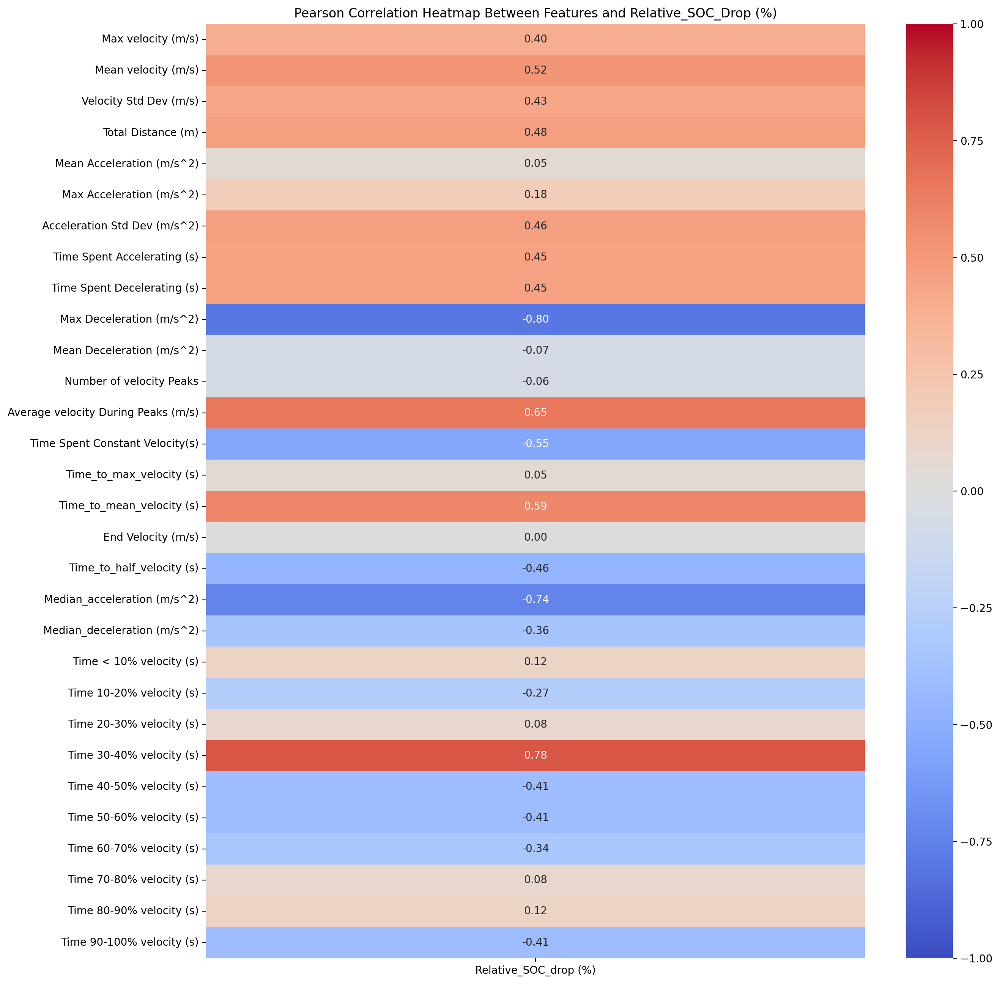

MAE: 5.488276300016003
MAPE: 0.07347141770712964


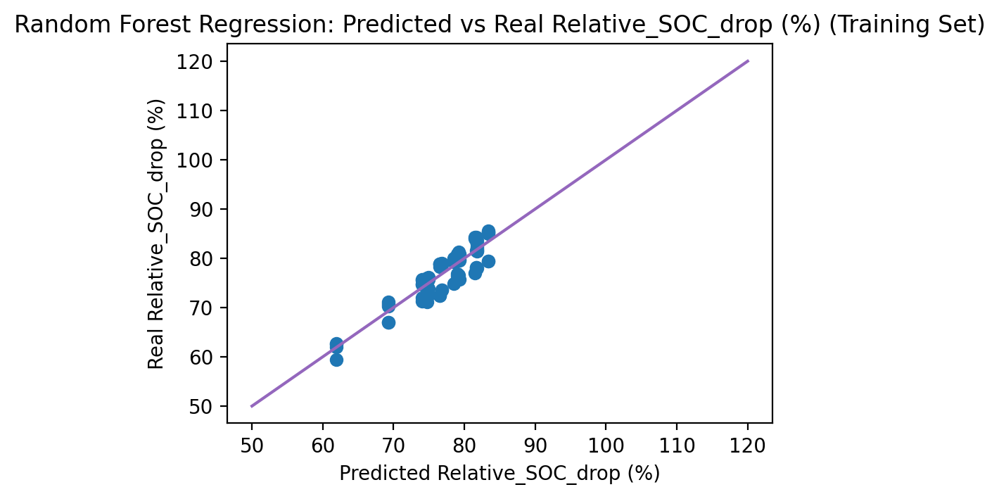

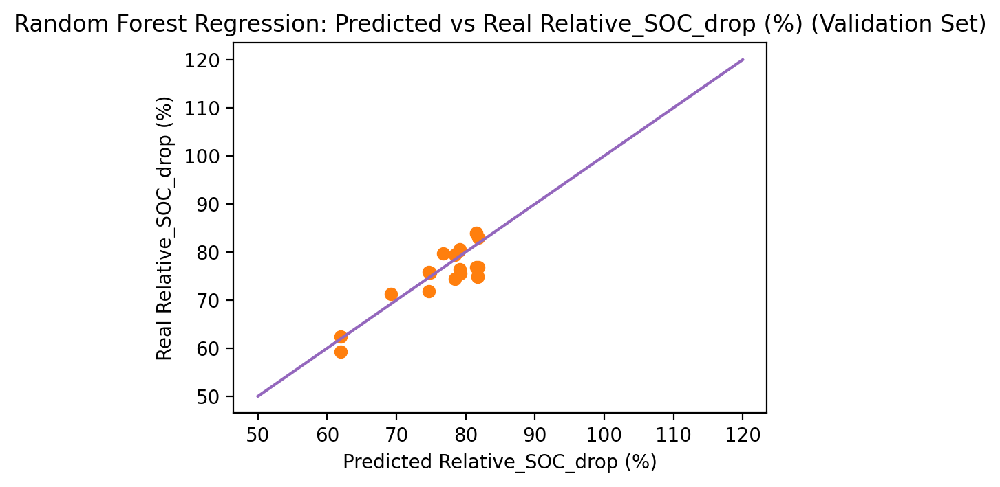

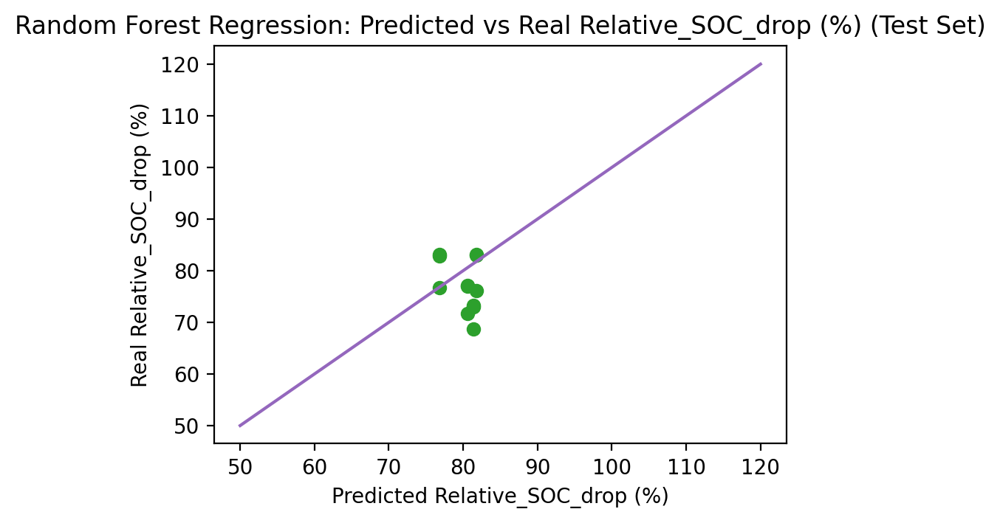

          time      speed
17  312.244898  24.285714
18  330.612245  24.880952
19  348.979592  25.476190
20  367.346939  22.630385
21  385.714286  23.650794
..         ...        ...
39  716.326531  23.769841
40  734.693878  23.979592
41  753.061224  24.092971
42  771.428571  24.206349
43  789.795918  24.319728

[27 rows x 2 columns]
          time      speed
18  308.571429  21.825397
19  325.714286  22.698413
20  342.857143  23.571429
21  360.000000  24.444444
22  377.142857  24.325397
..         ...        ...
42  720.000000  21.944444
43  737.142857  22.261905
44  754.285714  22.579365
45  771.428571  22.896825
46  788.571429  23.849206

[29 rows x 2 columns]


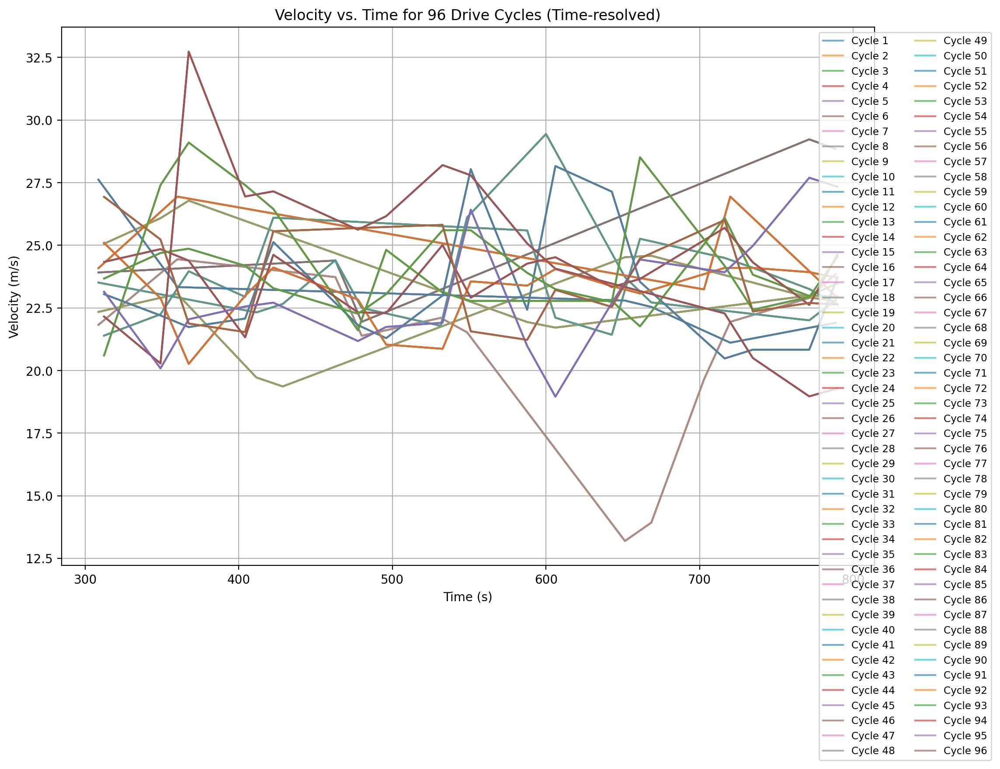

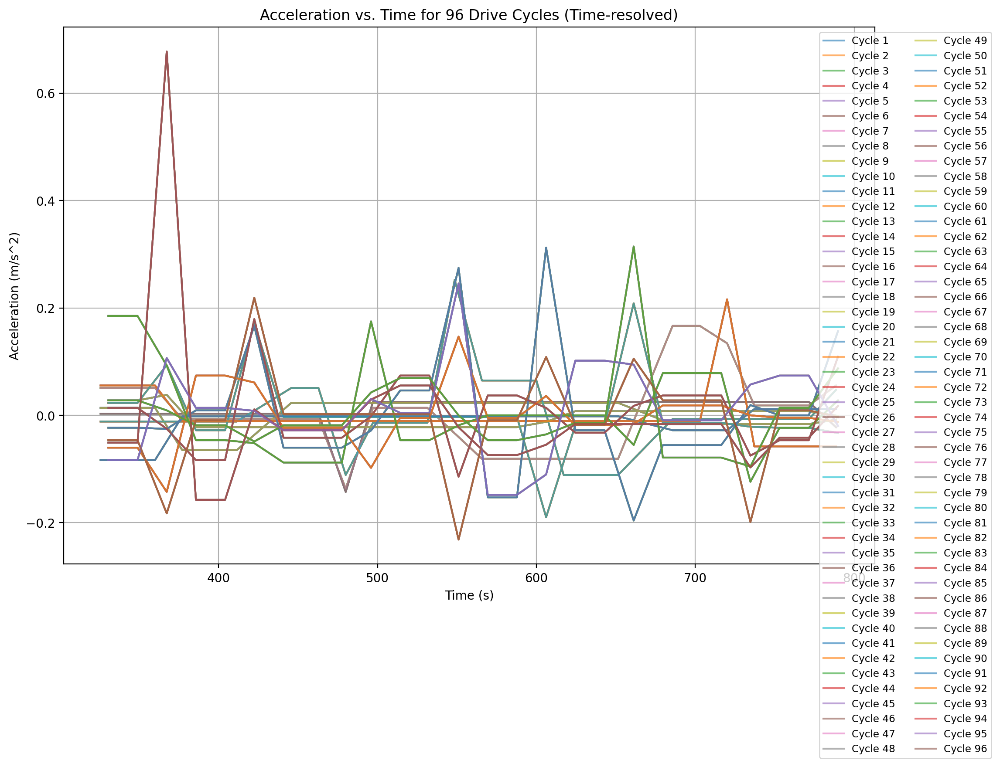

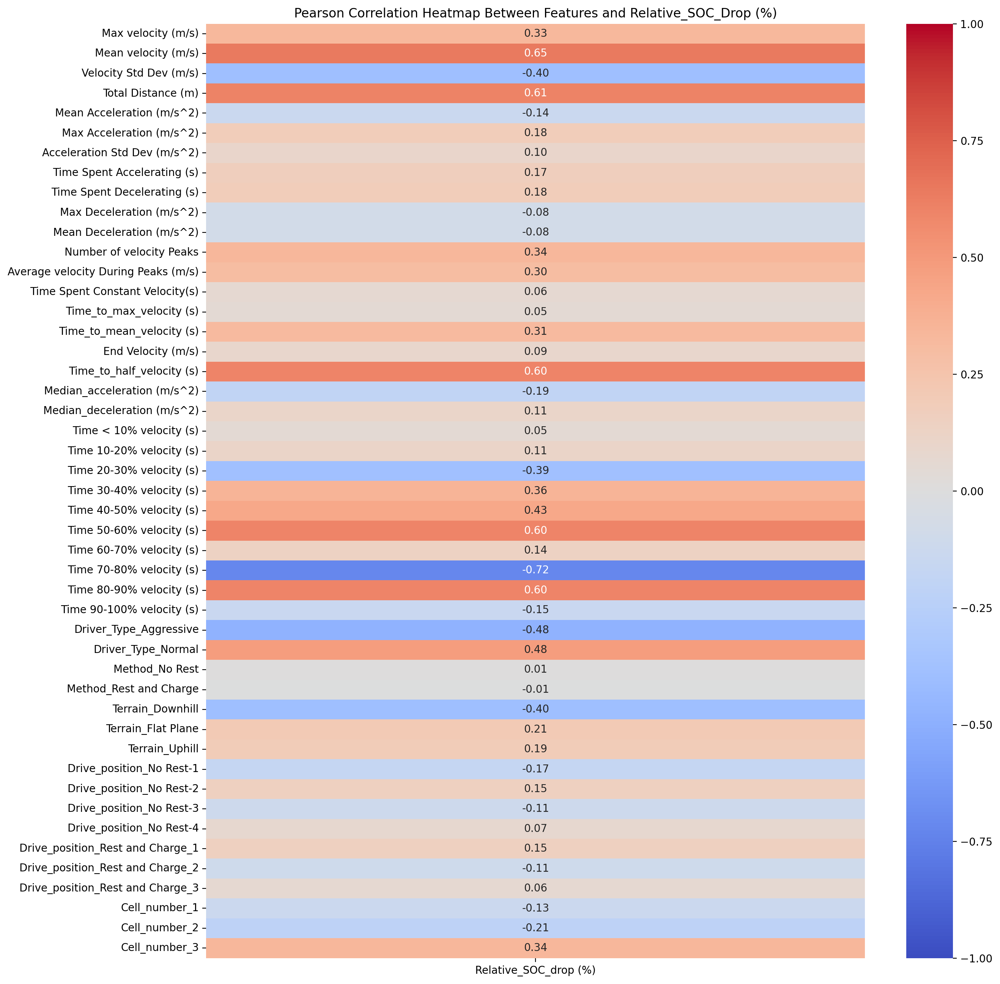

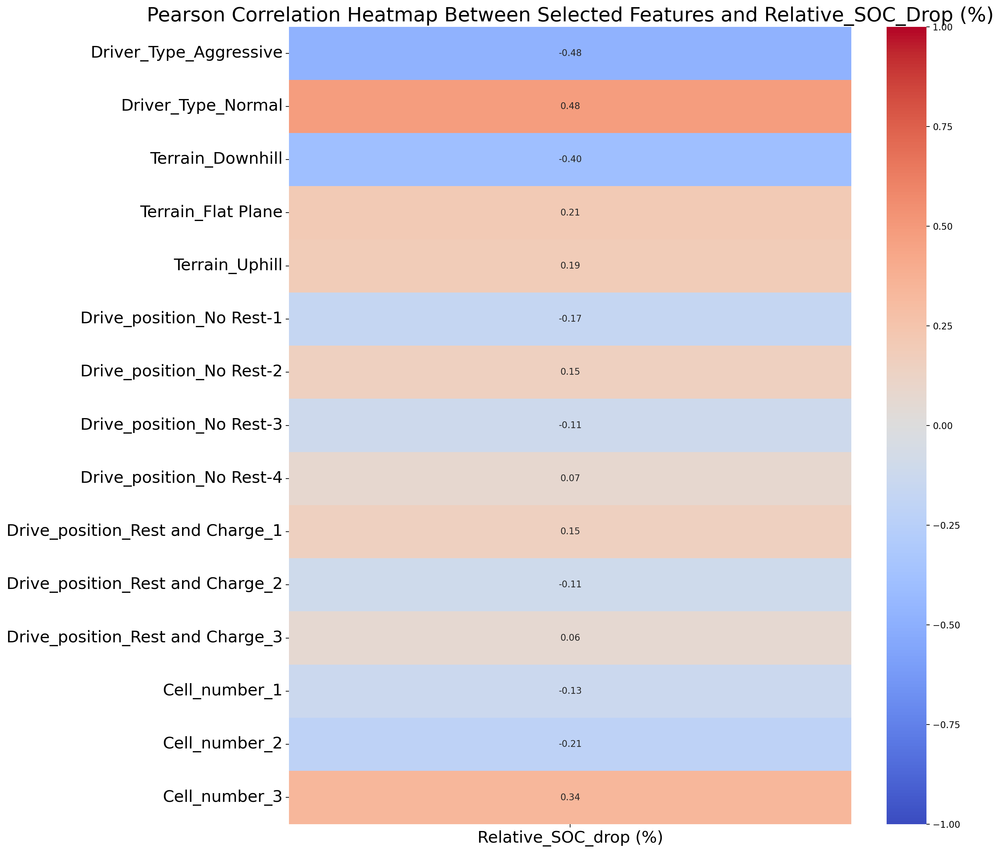

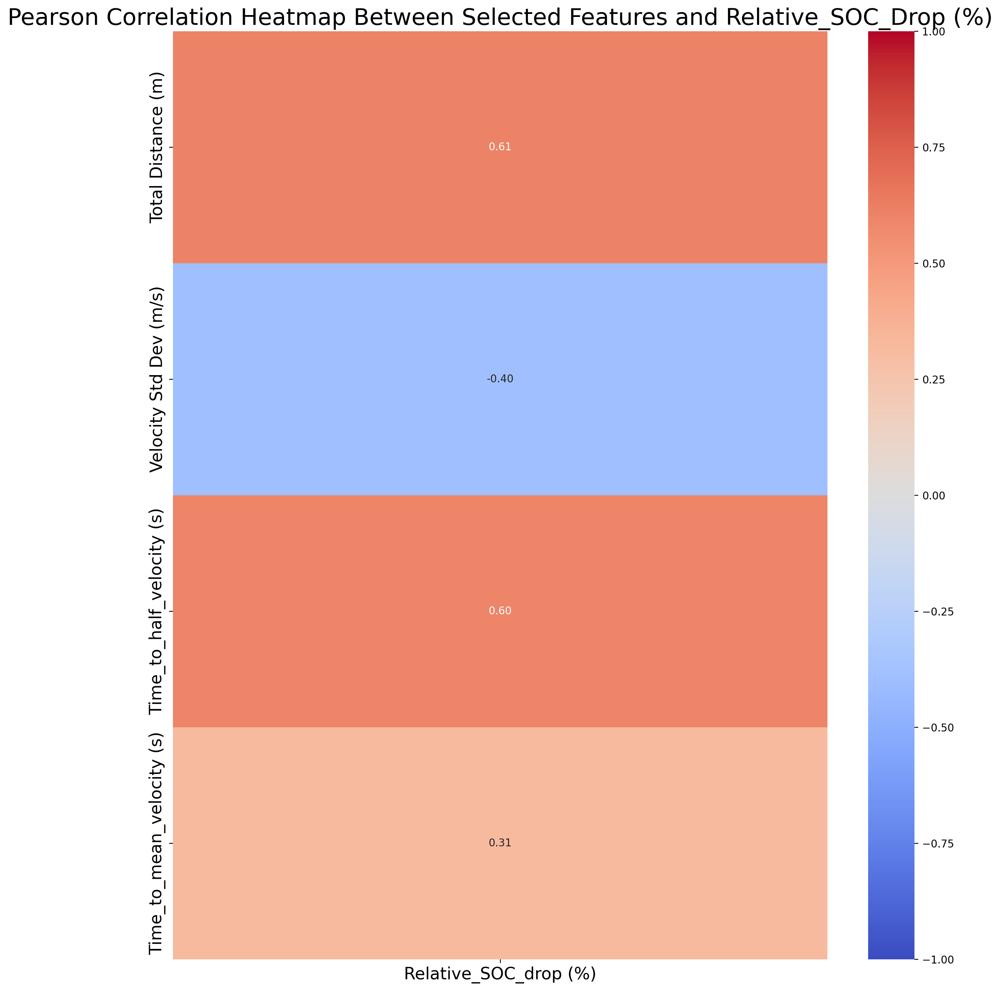

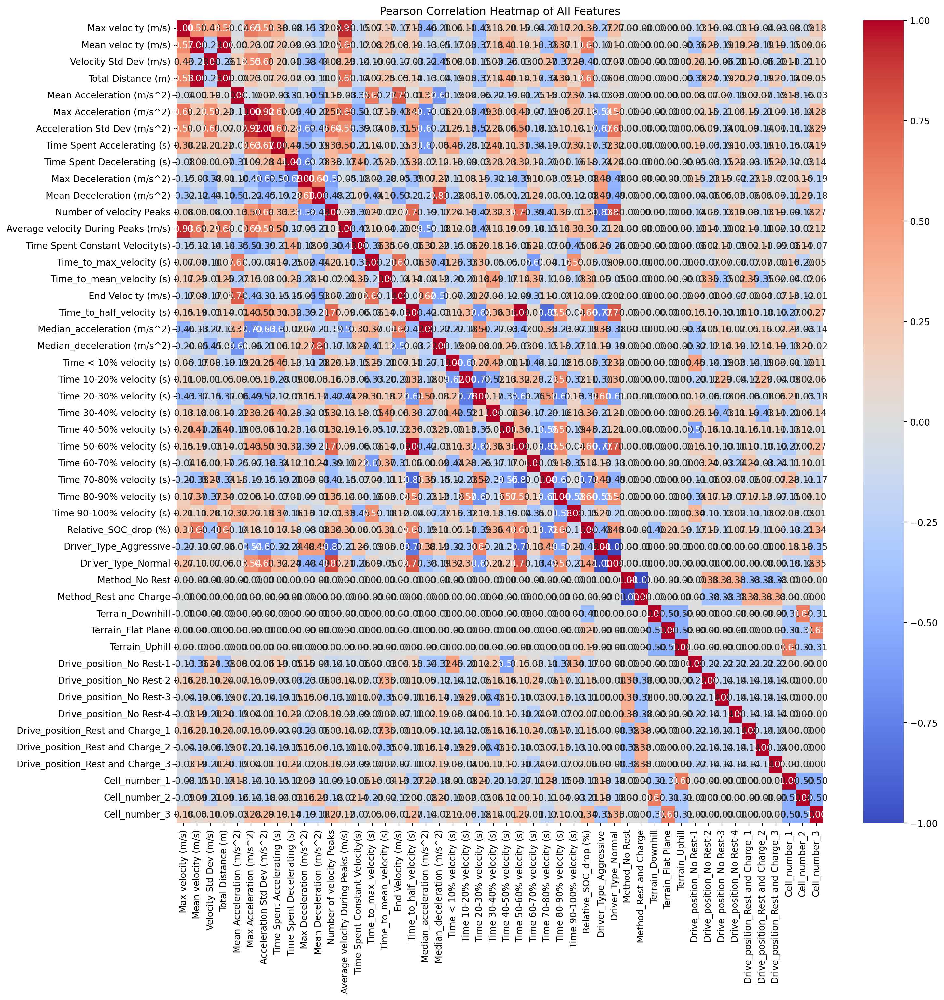

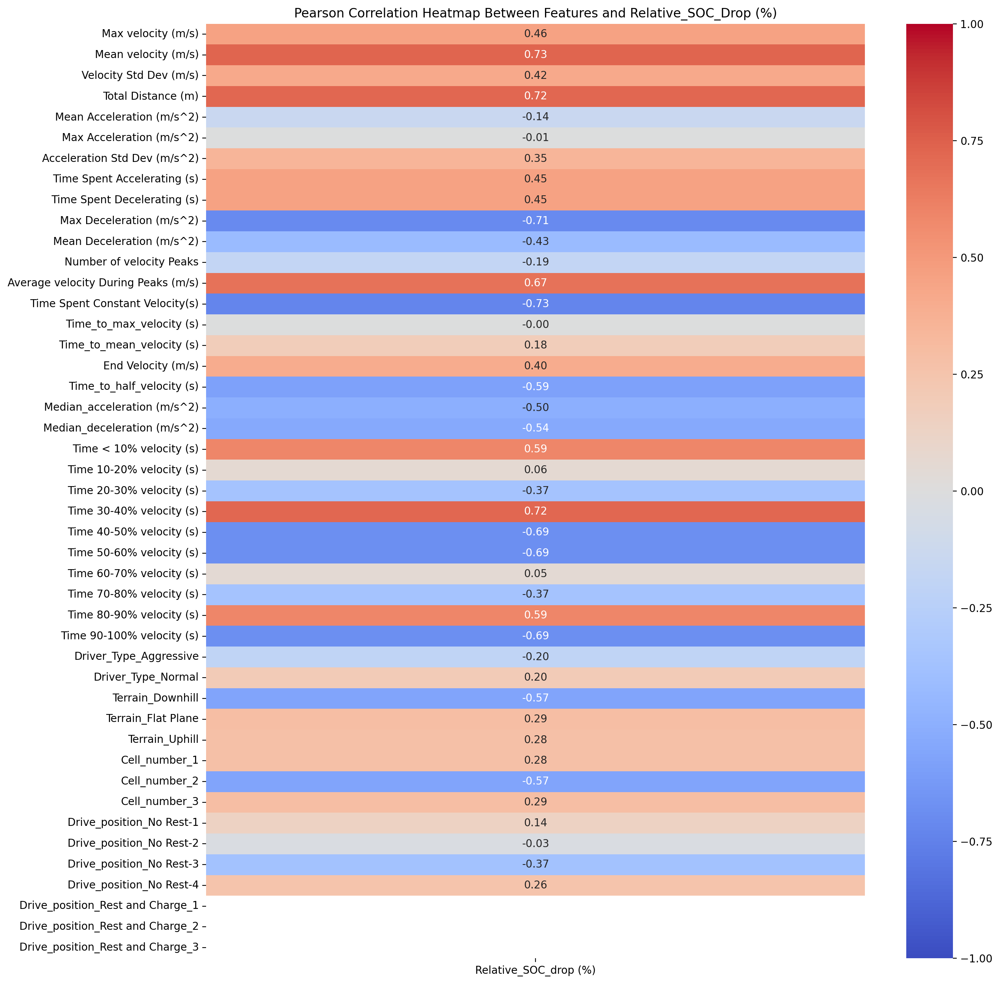

MAE: 3.8887609951692284
MAPE: 0.05227115873333247


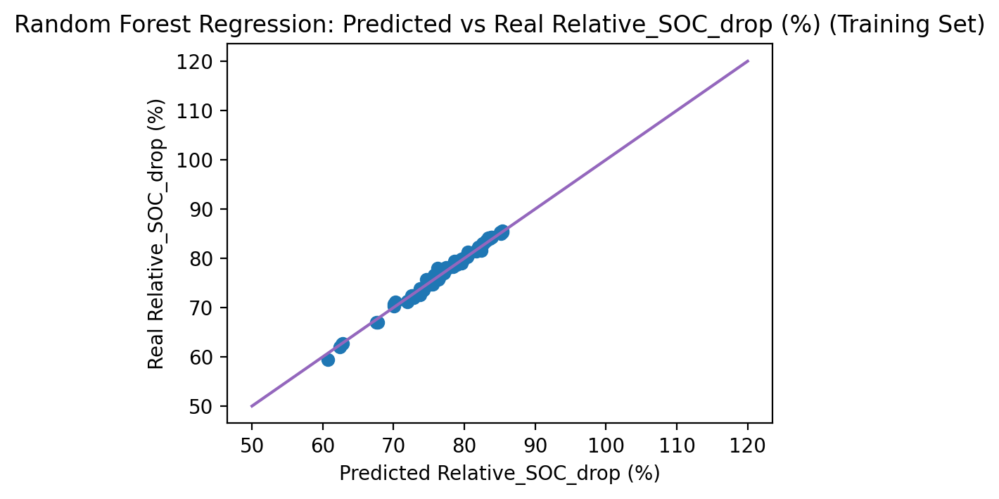

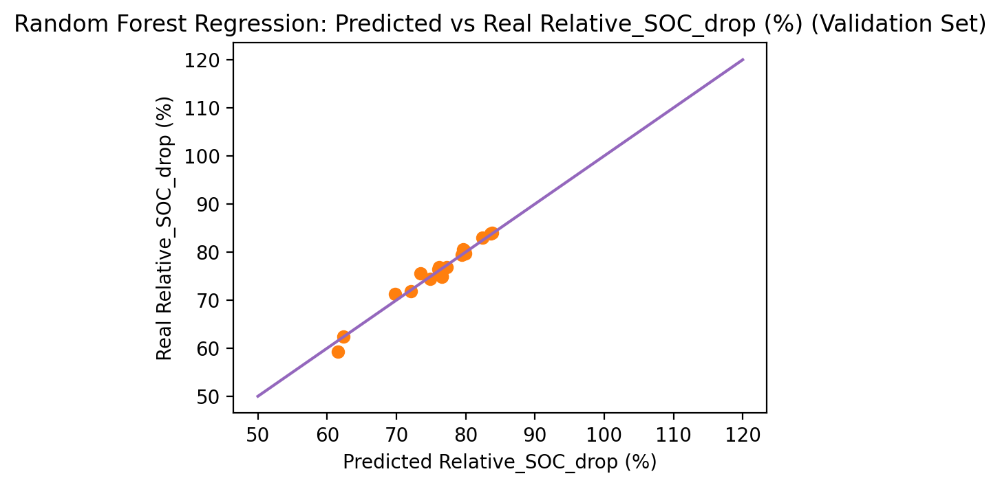

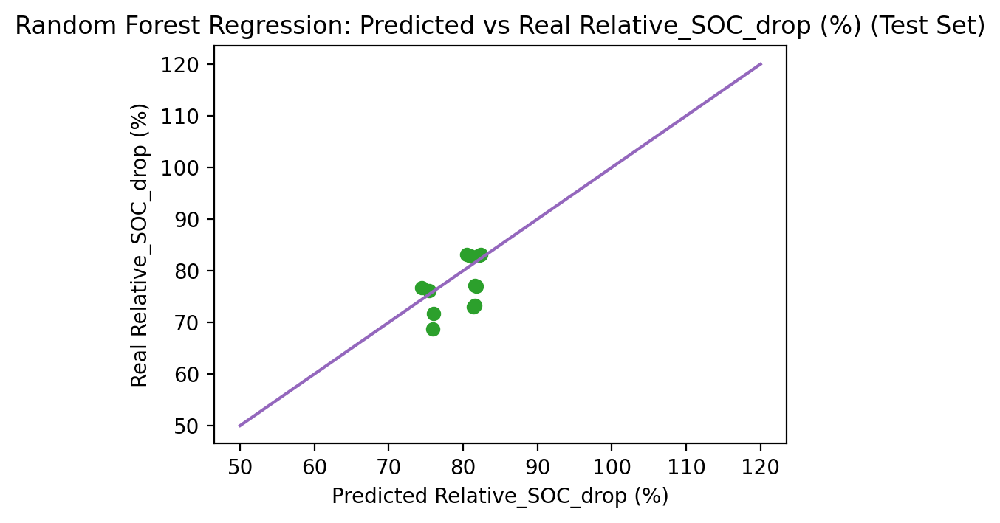

In [38]:
VEL_MODEL1 = VEL_MODELS / 'Velocity_Model-1_Relative_SOC_No_Iteration-Parity_plotting.ipynb'
VEL_MODEL2 = VEL_MODELS / 'Velocity_Model-2_Relative_SOC_No_Iteration-Parity_plotting.ipynb'

%run {VEL_MODEL1}
%run {VEL_MODEL2}

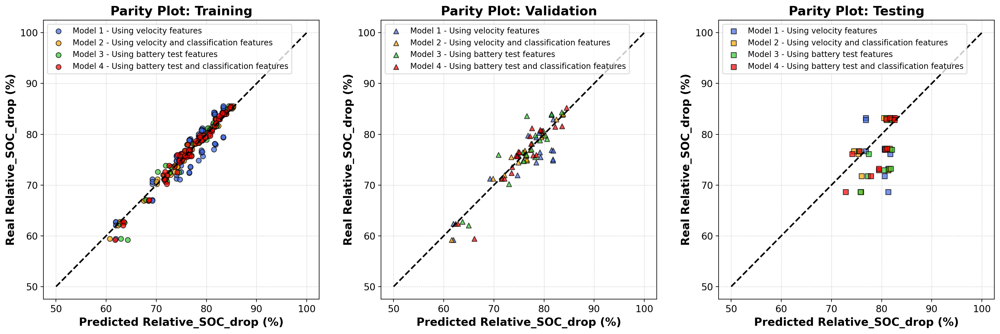

In [39]:
# Function to create combined parity plots for training, validation, and testing datasets respectively
def combined_parity_plots(model1_results, model2_results, model3_results, model4_results):
    # Unpack results from Model-1, Model-2, Model-3, and Model-4
    y_pred_train_1, y_train_1, y_pred_val_1, y_val_1, y_pred_test_1, y_test_1 = model1_results
    y_pred_train_2, y_train_2, y_pred_val_2, y_val_2, y_pred_test_2, y_test_2 = model2_results
    y_pred_train_3, y_train_3, y_pred_val_3, y_val_3, y_pred_test_3, y_test_3 = model3_results
    y_pred_train_4, y_train_4, y_pred_val_4, y_val_4, y_pred_test_4, y_test_4 = model4_results
    
    plt.figure(figsize=(18, 6))
    
    # Create subplots for training, validation, and testing
    for i, (pred1, real1, pred2, real2, pred3, real3, pred4, real4, title, marker, label) in enumerate([
        (y_pred_train_1, y_train_1, y_pred_train_2, y_train_2, y_pred_train_3, y_train_3, y_pred_train_4, y_train_4, 'Training', 'o', 'Training'),  # Circle for training
        (y_pred_val_1, y_val_1, y_pred_val_2, y_val_2, y_pred_val_3, y_val_3, y_pred_val_4, y_val_4, 'Validation', '^', 'Validation'),  # Triangle for validation
        (y_pred_test_1, y_test_1, y_pred_test_2, y_test_2, y_pred_test_3, y_test_3, y_pred_test_4, y_test_4, 'Testing', 's', 'Testing')  # Square for testing
    ]):
        plt.subplot(1, 3, i + 1) # 3 plots
        
        # Model-1 plots
        plt.scatter(pred1, real1, color='royalblue', marker=marker, s=40, edgecolor='black', label='Model 1 - Using velocity features', alpha=0.7)

        # Model-2 plots
        plt.scatter(pred2, real2, color='orange', marker=marker, s=40, edgecolor='black', label='Model 2 - Using velocity and classification features', alpha=0.7)
        
        # Model-3 plots
        plt.scatter(pred3, real3, color='limegreen', marker=marker, s=40, edgecolor='black', label='Model 3 - Using battery test features', alpha=0.7)
        
        # Model-4 plots
        plt.scatter(pred4, real4, color='red', marker=marker, s=40, edgecolor='black', label='Model 4 - Using battery test and classification features', alpha=0.7)
        
        # Diagonal reference line
        plt.plot([50, 100], [50, 100], color='black', linestyle='--', linewidth=2)
        
        # Labels and title
        plt.xlabel('Predicted Relative_SOC_drop (%)', fontsize=14, fontweight='bold')
        plt.ylabel('Real Relative_SOC_drop (%)', fontsize=14, fontweight='bold')
        plt.title(f'Parity Plot: {title}', fontsize=16, fontweight='bold')
        
        # Add a subtle grid for better readability
        plt.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
        
        # Customize ticks
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)

        # Adding legends for all subplots
        plt.legend(loc='upper left', fontsize=10, frameon=True, shadow=False)
        
    # Adjust layout
    plt.tight_layout()
    # plt.savefig('plot6.png', format='png', dpi=1000)
    # Show the combined plot
    plt.show()

# New results for Model-3 & 4
data_3 = np.load(MISC_DIR / 'predictions_and_labels_for_battery_data.npz')
model_3_results = (
    data_3['y_pred_train_3'], data_3['y_train_3'],
    data_3['y_pred_val_3'], data_3['y_val_3'],
    data_3['y_pred_test_3'], data_3['y_test_3']
)
data_4 = np.load(MISC_DIR / 'predictions_and_labels_for_battery_data+classification.npz')
model_4_results = (
    data_4['y_pred_train_4'], data_4['y_train_4'],
    data_4['y_pred_val_4'], data_4['y_val_4'],
    data_4['y_pred_test_4'], data_4['y_test_4']
)

# Call the combined parity plots function with Model-3
combined_parity_plots(model_1_results, model_2_results, model_3_results, model_4_results)

## Hemanth's plotting

In [40]:
data_3 = np.load(MISC_DIR / 'predictions_and_labels_for_battery_data.npz')
model_3_results = (
    data_3['y_pred_train_3'], data_3['y_train_3'],
    data_3['y_pred_val_3'], data_3['y_val_3'],
    data_3['y_pred_test_3'], data_3['y_test_3']
)
data_4 = np.load(MISC_DIR / 'predictions_and_labels_for_battery_data+classification.npz')
model_4_results = (
    data_4['y_pred_train_4'], data_4['y_train_4'],
    data_4['y_pred_val_4'], data_4['y_val_4'],
    data_4['y_pred_test_4'], data_4['y_test_4'])

y_pred_train_1, y_train_1, y_pred_val_1, y_val_1, y_pred_test_1, y_test_1 = model_1_results
y_pred_train_2, y_train_2, y_pred_val_2, y_val_2, y_pred_test_2, y_test_2 = model_2_results

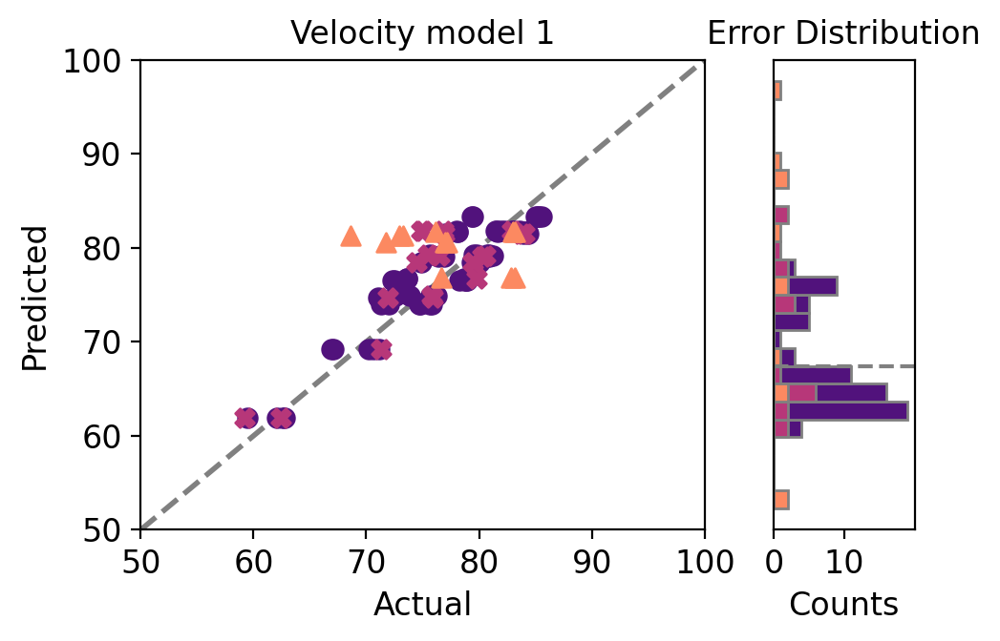

In [41]:
plt.rcParams['figure.figsize'] = (5, 3.5)  # Adjust the size to fit parity plot and histograms

# Extract three colors from the Seaborn 'mako' colormap
colors = sns.color_palette("magma", 3)
train_color = colors[0]
val_color = colors[1]
test_color = colors[2]

# Calculate errors
train_errors = y_pred_train_1 - y_train_1
val_errors = y_pred_val_1 - y_val_1
test_errors = y_pred_test_1 - y_test_1

# Determine a common bin range and bin size
all_errors = np.concatenate([train_errors, val_errors, test_errors])
min_error, max_error = np.min(all_errors), np.max(all_errors)
bins = np.linspace(min_error, max_error, 25)  # Define 15 uniform bins across all errors

gs = GridSpec(1, 2, width_ratios=[4, 1])  # 2 columns: 1 parity plot + 1 column for error histograms

# Combined parity plot for train, validation, and test data
ax0 = plt.subplot(gs[0])
ax0.scatter(y_train_1, y_pred_train_1, color=train_color, s=50, label='Train', marker='o')
ax0.scatter(y_val_1, y_pred_val_1, color=val_color, s=50, label='Validation', marker='X')
ax0.scatter(y_test_1, y_pred_test_1, color=test_color, s=50, label='Test', marker='^')
ax0.plot([50, 100], [50, 100], '--', lw=2, color="grey", zorder = 0)
ax0.set_xlabel('Actual', fontsize=12)
ax0.set_ylabel('Predicted', fontsize=12)
ax0.set_xlim(50, 100)
ax0.set_ylim(50, 100)
ax0.set_title('Velocity model 1', fontsize=12)
ax0.tick_params(axis='both', which='major', labelsize=12)

# Separate error histograms for each dataset
ax1 = plt.subplot(gs[1])
ax1.hist(train_errors, bins=bins, color=train_color, orientation='horizontal', label='Train', edgecolor = 'grey')
ax1.hist(val_errors, bins=bins,color=val_color, orientation='horizontal', label='Validation', edgecolor = 'grey')
ax1.hist(test_errors, bins=bins, color=test_color, orientation='horizontal', label='Test', edgecolor = 'grey')
ax1.set_xlabel('Counts', fontsize=12)
ax1.set_title('Error Distribution', fontsize=12)
ax1.axhline(0, color='grey', linestyle='--', linewidth=1.5)
ax1.tick_params(axis='x', which='major', labelsize=12)
ax1.yaxis.set_ticks([]) 

# Adjust layout and show the plot
plt.tight_layout()
# plt.savefig('/Users/hemanthnr/Library/Mobile Documents/com~apple~CloudDocs/V1.svg', format='svg', dpi = 1200,  bbox_inches='tight')
plt.show()

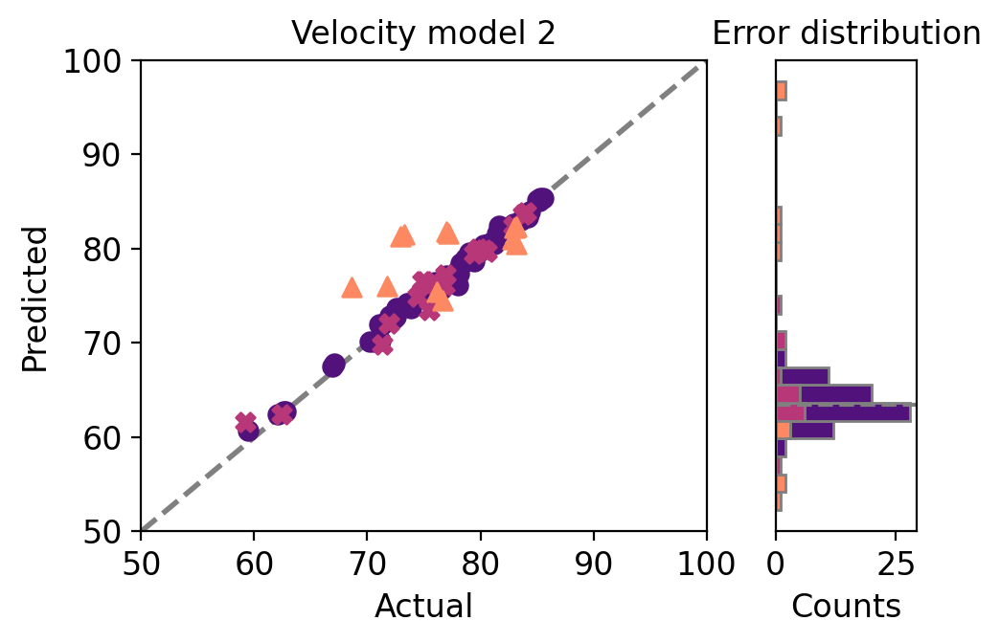

In [42]:
sns.reset_orig()
plt.rcdefaults()
set_matplotlib_formats('retina')
plt.rcParams['figure.figsize'] = (5, 3.5) 

# Extract three colors from the Seaborn 'mako' colormap
colors = sns.color_palette("magma", 3)
train_color = colors[0]
val_color = colors[1]
test_color = colors[2]

# Calculate errors
train_errors = y_pred_train_2 - y_train_2
val_errors = y_pred_val_2 - y_val_2
test_errors = y_pred_test_2 - y_test_2

# Determine a common bin range and bin size
all_errors = np.concatenate([train_errors, val_errors, test_errors])
min_error, max_error = np.min(all_errors), np.max(all_errors)
bins = np.linspace(min_error, max_error, 25)  # Define 15 uniform bins

# Create a figure with GridSpec layout
gs = GridSpec(1, 2, width_ratios=[4, 1])  # 2 columns: 1 parity plot + 1 column for error histograms

# Combined parity plot for train, validation, and test data
ax0 = plt.subplot(gs[0])
ax0.scatter(y_train_2, y_pred_train_2, color=train_color, s=50, label='Train', marker='o')
ax0.scatter(y_val_2, y_pred_val_2, color=val_color, s=50, label='Validation', marker='X')
ax0.scatter(y_test_2, y_pred_test_2, color=test_color, s=50, label='Test', marker='^')
ax0.plot([50, 100], [50, 100], '--', lw=2, color="grey", zorder = 0)
ax0.set_xlabel('Actual', fontsize=12)
ax0.set_ylabel('Predicted', fontsize=12)
ax0.set_xlim(50, 100)
ax0.set_ylim(50, 100)
ax0.set_title('Velocity model 2', fontsize=12)
ax0.tick_params(axis='both', which='major', labelsize=12)

# Separate error histograms for each dataset
ax1 = plt.subplot(gs[1])
ax1.hist(train_errors, bins=bins,color=train_color, orientation='horizontal',  edgecolor = 'grey')
ax1.hist(val_errors, bins=bins, color=val_color, orientation='horizontal',  edgecolor = 'grey')
ax1.hist(test_errors, bins=bins, color=test_color, orientation='horizontal',  edgecolor = 'grey')
ax1.set_xlabel('Counts', fontsize=12)
ax1.set_title('Error distribution', fontsize=12)
ax1.axhline(0, color='grey', linestyle='--', linewidth=1.5)
ax1.tick_params(axis='x', which='major', labelsize=12)
ax1.yaxis.set_ticks([]) 

# Adjust layout and show the plot
plt.tight_layout()
# plt.savefig('/Users/hemanthnr/Library/Mobile Documents/com~apple~CloudDocs/V2.svg', format='svg', dpi = 1200,  bbox_inches='tight')
plt.show()

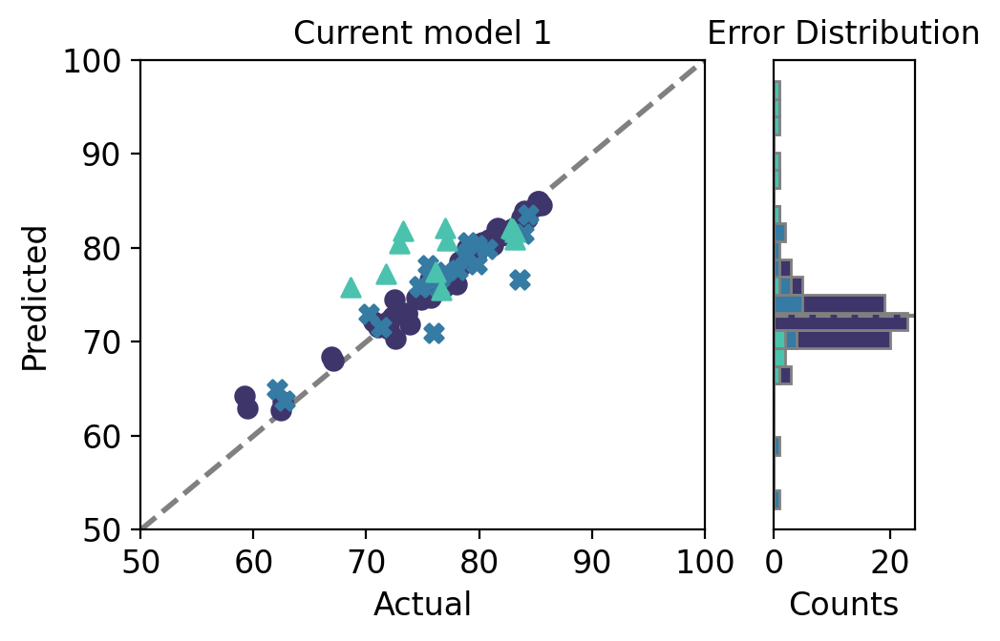

In [43]:
plt.rcParams['figure.figsize'] = (5, 3.5)   # Adjust the size to fit parity plot and histograms

# Extract three colors from the Seaborn 'mako' colormap
colors = sns.color_palette("mako", 3)
train_color = colors[0]
val_color = colors[1]
test_color = colors[2]

# Load data
data_3 = np.load(MISC_DIR / 'predictions_and_labels_for_battery_data.npz')
y_pred_train_3, y_train_3, y_pred_val_3, y_val_3, y_pred_test_3, y_test_3 = (
    data_3['y_pred_train_3'], data_3['y_train_3'],
    data_3['y_pred_val_3'], data_3['y_val_3'],
    data_3['y_pred_test_3'], data_3['y_test_3']
)

# Calculate errors
train_errors = y_pred_train_3 - y_train_3
val_errors = y_pred_val_3 - y_val_3
test_errors = y_pred_test_3 - y_test_3

# Determine a common bin range and bin size
all_errors = np.concatenate([train_errors, val_errors, test_errors])
min_error, max_error = np.min(all_errors), np.max(all_errors)
bins = np.linspace(min_error, max_error, 25)  

gs = GridSpec(1, 2, width_ratios=[4, 1]) 

# Combined parity plot for train, validation, and test data
ax0 = plt.subplot(gs[0])
ax0.scatter(y_train_3, y_pred_train_3, color=train_color, s=50, label='Train', marker='o')
ax0.scatter(y_val_3, y_pred_val_3, color=val_color, s=50, label='Validation',marker='X')
ax0.scatter(y_test_3, y_pred_test_3, color=test_color, s=50, label='Test', marker='^')
ax0.plot([50, 100], [50, 100], '--', lw=2, color="grey", zorder = 0)  # Ideal parity line
ax0.set_xlabel('Actual', fontsize=12)
ax0.set_ylabel('Predicted', fontsize=12)
ax0.set_xlim(50, 100)
ax0.set_ylim(50, 100)
ax0.set_title('Current model 1', fontsize=12)
ax0.tick_params(axis='both', which='major', labelsize=12)

# Separate error histograms for each dataset using the same bins
ax1 = plt.subplot(gs[1])
ax1.hist(train_errors, bins=bins, color=train_color, orientation='horizontal', label='Train', edgecolor='grey')
ax1.hist(val_errors, bins=bins, color=val_color, orientation='horizontal', label='Validation', edgecolor='grey')
ax1.hist(test_errors, bins=bins, color=test_color, orientation='horizontal', label='Test', edgecolor='grey')
ax1.set_xlabel('Counts', fontsize=12)
ax1.set_title('Error Distribution', fontsize=12)
ax1.axhline(0, color='grey', linestyle='--', linewidth=1.5)
ax1.tick_params(axis='x', which='major', labelsize=12)
ax1.yaxis.set_ticks([]) 


# Adjust layout and show the plot
plt.tight_layout()
# plt.savefig('/Users/hemanthnr/Library/Mobile Documents/com~apple~CloudDocs/C1.svg', format='svg', dpi = 1200,  bbox_inches='tight')
plt.show()

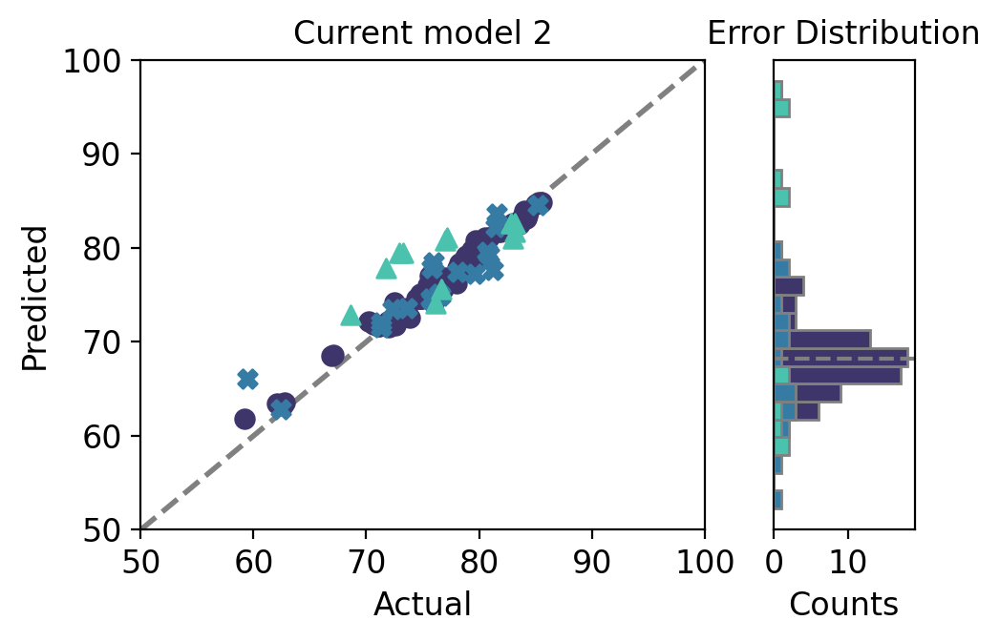

In [47]:
plt.rcParams['figure.figsize'] = (5, 3.5)   # Adjust the size to fit parity plot and histograms

# Extract three colors from the Seaborn 'mako' colormap
colors = sns.color_palette("mako", 3)
train_color = colors[0]
val_color = colors[1]
test_color = colors[2]

# Load data
data_4 = np.load(MISC_DIR / 'predictions_and_labels_for_battery_data+classification.npz')
y_pred_train_4, y_train_4, y_pred_val_4, y_val_4, y_pred_test_4, y_test_4 = (
    data_4['y_pred_train_4'], data_4['y_train_4'],
    data_4['y_pred_val_4'], data_4['y_val_4'],
    data_4['y_pred_test_4'], data_4['y_test_4']
)

# Calculate errors
train_errors = y_pred_train_4 - y_train_4
val_errors = y_pred_val_4 - y_val_4
test_errors = y_pred_test_4 - y_test_4

# Determine a common bin range and bin size
all_errors = np.concatenate([train_errors, val_errors, test_errors])
min_error, max_error = np.min(all_errors), np.max(all_errors)
bins = np.linspace(min_error, max_error, 25)  # Define 15 uniform bins across all errors

gs = GridSpec(1, 2, width_ratios=[4, 1])  # 2 columns: 1 parity plot + 1 column for error histograms

# Combined parity plot for train, validation, and test data
ax0 = plt.subplot(gs[0])
ax0.scatter(y_train_4, y_pred_train_4, color=train_color, s=50, label='Train', marker='o')
ax0.scatter(y_val_4, y_pred_val_4, color=val_color, s=50, label='Validation', marker='X')
ax0.scatter(y_test_4, y_pred_test_4, color=test_color, s=50, label='Test', marker='^')
ax0.plot([50, 100], [50, 100], '--', lw=2, color="grey", zorder = 0)  # Ideal parity line
ax0.set_xlabel('Actual', fontsize=12)
ax0.set_ylabel('Predicted', fontsize=12)
ax0.set_xlim(50, 100)
ax0.set_ylim(50, 100)
ax0.set_title('Current model 2', fontsize=12)
ax0.tick_params(axis='both', which='major', labelsize=12)

# Separate error histograms for each dataset using the same bins
ax1 = plt.subplot(gs[1])
ax1.hist(train_errors, bins=bins, color=train_color, orientation='horizontal', label='Train',  edgecolor='grey')
ax1.hist(val_errors, bins=bins, color=val_color, orientation='horizontal', label='Validation', edgecolor='grey')
ax1.hist(test_errors, bins=bins,  color=test_color, orientation='horizontal', label='Test', edgecolor='grey')
ax1.set_xlabel('Counts', fontsize=12)
ax1.set_title('Error Distribution', fontsize=12)
ax1.axhline(0, color='grey', linestyle='--', linewidth=1.5)
ax1.tick_params(axis='x', which='major', labelsize=12)
ax1.yaxis.set_ticks([]) 

# Adjust layout and show the plot
plt.tight_layout()
# plt.savefig('/Users/hemanthnr/Library/Mobile Documents/com~apple~CloudDocs/C2.svg', format='svg', dpi = 1200,  bbox_inches='tight')
plt.show()


In [48]:
raw = np.load(MISC_DIR / 'predictions_and_labels_for_battery_data.npz')
print(raw['y_pred_train_3'])

[74.53593722 75.65803502 79.50563134 76.09966071 77.03858472 82.08133829
 71.51297731 72.62573704 68.43524681 80.24878867 81.79676633 67.99558352
 79.99630441 64.26739114 76.47959575 80.72342951 75.99181171 79.38312302
 76.41462722 72.18674365 79.60130009 70.30325549 80.8847306  74.51055359
 74.77676722 83.23330333 78.31982119 83.11109398 79.03437519 72.97546741
 75.27300305 76.63140113 82.04191454 83.23831732 63.66237784 80.53519945
 84.51954202 71.78629332 75.64654271 84.96485072 71.85319631 74.65858862
 75.75551987 80.11820514 76.44141526 84.90995229 80.61054273 77.59504771
 83.24434557 82.00900138 62.95818387 79.82281689 79.0333249  81.31974556
 84.40663985 76.73280569 76.23800687 62.68109178 78.56757982 81.95819755
 79.25717604 71.38221828 75.44274455 83.94488878 75.00424061 78.94025186
 81.40863451 80.77484233 80.41528598 71.74522498 81.34305342 79.05394763
 80.42102302 72.17596088 73.05892029 74.73352052]
